# Solar Power Plant

# Introduction

This data has been gathered at two solar power plants in India over a 34 day period. It has two pairs of files - each pair has one power generation dataset and one sensor readings dataset. The power generation datasets are gathered at the inverter level - each inverter has multiple lines of solar panels attached to it. The sensor data is gathered at a plant level - single array of sensors optimally placed at the plant.

- Power Generation - both DC and AC energy from the inverter and solar panels
- Weather Data - weather and module temperatures

## Challenge

1. Can we predict the power generation for next couple of days?
2. Can we identify the need for panel cleaning or maintenance?
3. Can we identify faulty or suboptimally performing equipment? 


In [3]:
# Let's start with just one plant
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go

sns.set_style('darkgrid')
import warnings
import datetime as dt
import matplotlib.dates as mdates

#Challenge 2&3
from plotly.subplots import make_subplots
from sklearn.metrics import mean_squared_error
from matplotlib.pyplot import figure

xformatter = mdates.DateFormatter('%H:%M') # for time axis plots
import sklearn
from scipy.optimize import curve_fit
warnings.filterwarnings('ignore')

In [4]:
# Import the datas

gen1 = pd.read_csv('Plant_1_Generation_Data.csv')
sen1 = pd.read_csv('Plant_1_Weather_Sensor_Data.csv')

gen_1 = gen1.copy()
sen_1 = sen1.copy()
gen_1.drop(['PLANT_ID'],1, inplace = True)
sen_1.drop(['PLANT_ID'],1, inplace = True)

gen_1['DATE_TIME'] = pd.to_datetime(gen_1['DATE_TIME'], format = '%d-%m-%Y %H:%M')
sen_1['DATE_TIME'] = pd.to_datetime(sen_1['DATE_TIME'], format = '%Y-%m-%d %H:%M:%S')

#gen2 = pd.read_csv('Plant_2_Generation_Data.csv')
#sen2 = pd.read_csv('Plant_2_Weather_Sensor_Data.csv')

#gen2.drop(['PLANT_ID'], inplace = True)
#sen2.drop(['PLANT_ID'], inplace = True)

gen_1.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0



# Describe the Data

In [5]:
gen1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   DATE_TIME    68778 non-null  object 
 1   PLANT_ID     68778 non-null  int64  
 2   SOURCE_KEY   68778 non-null  object 
 3   DC_POWER     68778 non-null  float64
 4   AC_POWER     68778 non-null  float64
 5   DAILY_YIELD  68778 non-null  float64
 6   TOTAL_YIELD  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB


## Generation Dataset
- DATE_TIME = date and time with 15 minute intervals
- PLANT_ID = removed as its the same, useful when looking at multiple plants
- SOURCE_KEY = inverter ID
- DC_POWER = DC Power by inverter in kW
- AC_POWER = AC Power by inveter in kW
- TOTAL_YIELD: Calculated Total Yield by inverter at specified time. 

## Sensor Dataset
- SOURCE_KEY = inverter ID
- AMBIENT_TEMPERATURE = temperature at the plant in degC
- MODULE_TEMPERATURE = temperature on the sensor panel in degC
- IRRADIATION = kW/m^2



In [6]:
gen1.describe()
sen1.describe()

,PLANT_ID,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
count,3182.0,3182.000000,3182.000000,3182.000000
mean,4135001.0,25.531606,31.091015,0.228313
std,0.0,3.354856,12.261222,0.300836
min,4135001.0,20.398505,18.140415,0.000000
25%,4135001.0,22.705182,21.090553,0.000000
50%,4135001.0,24.613814,24.618060,0.024653
75%,4135001.0,27.920532,41.307840,0.449588
max,4135001.0,35.252486,65.545714,1.221652


In [7]:
gen1.isnull().sum().sort_values(ascending=False)
sen1.isnull().sum().sort_values(ascending=False)

DATE_TIME              0
PLANT_ID               0
SOURCE_KEY             0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
dtype: int64

Based on the describe() and isnull(), we have no missing values. We could use nunique() on the PLANT_ID to verify there's no other plant data in here. 

In [8]:
print('Count : {} \nMinimum : {} \nMaximum : {} '.format(
    gen1['SOURCE_KEY'].nunique(),
    gen1['SOURCE_KEY'].value_counts().min(),
    gen1['SOURCE_KEY'].value_counts().max()))

Count : 22 
Minimum : 3104 
Maximum : 3155 


Dataset overall is good, we do have to account for the fact that some arrays are missing data points. One of the inverters is missing 51 data points (51 x 15 min = 17 hrs worth of data).

In [9]:
gen1['SOURCE_KEY'].value_counts().median()

3124.5

Based on the median and mean, the missing data points will likely not be high impact on the model. 

# Correlation and Outlier Analysis

In [10]:
df_plant1 = pd.merge(gen_1, sen_1.drop(columns = 'SOURCE_KEY'), on='DATE_TIME')
df_plant1['Date'] = df_plant1['DATE_TIME'].dt.date
df_plant1['Time'] = df_plant1['DATE_TIME'].dt.time

df_plant1.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,Date,Time
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,2020-05-15,00:00:00
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2020-05-15,00:00:00
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,2020-05-15,00:00:00
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,2020-05-15,00:00:00
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,2020-05-15,00:00:00


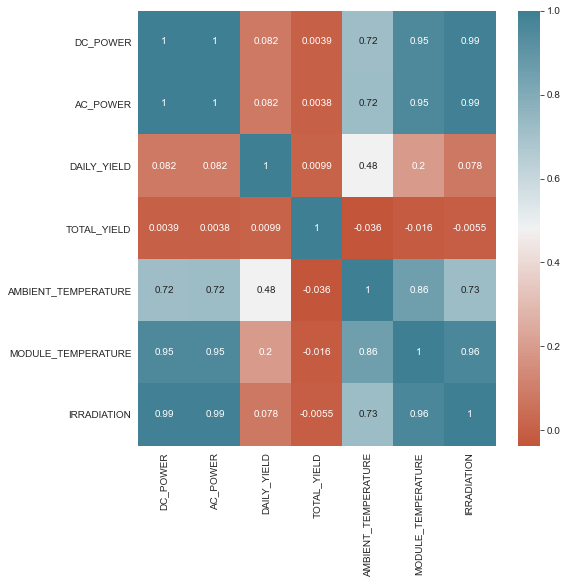

In [11]:
# https://towardsdatascience.com/better-heatmaps-and-correlation-matrix-plots-in-python-41445d0f2bec
corr_matrix = df_plant1.corr()
plt.figure(figsize=(8,8))

n_colors = 256 # Use 256 colors for the diverging color palette
palette = sns.diverging_palette(20, 220, n=n_colors) # Create the palette
corr_fig = sns.heatmap(corr_matrix, cmap = palette, annot= True)
plt.show()

- High(est) Correlation = DC_POWER and AC_POWER
- High Correlation = DC_POWER and AC_POWER // Irradiation 
- Some Correlation = POWEr // Module Temp, Irradiation // Module Temp 

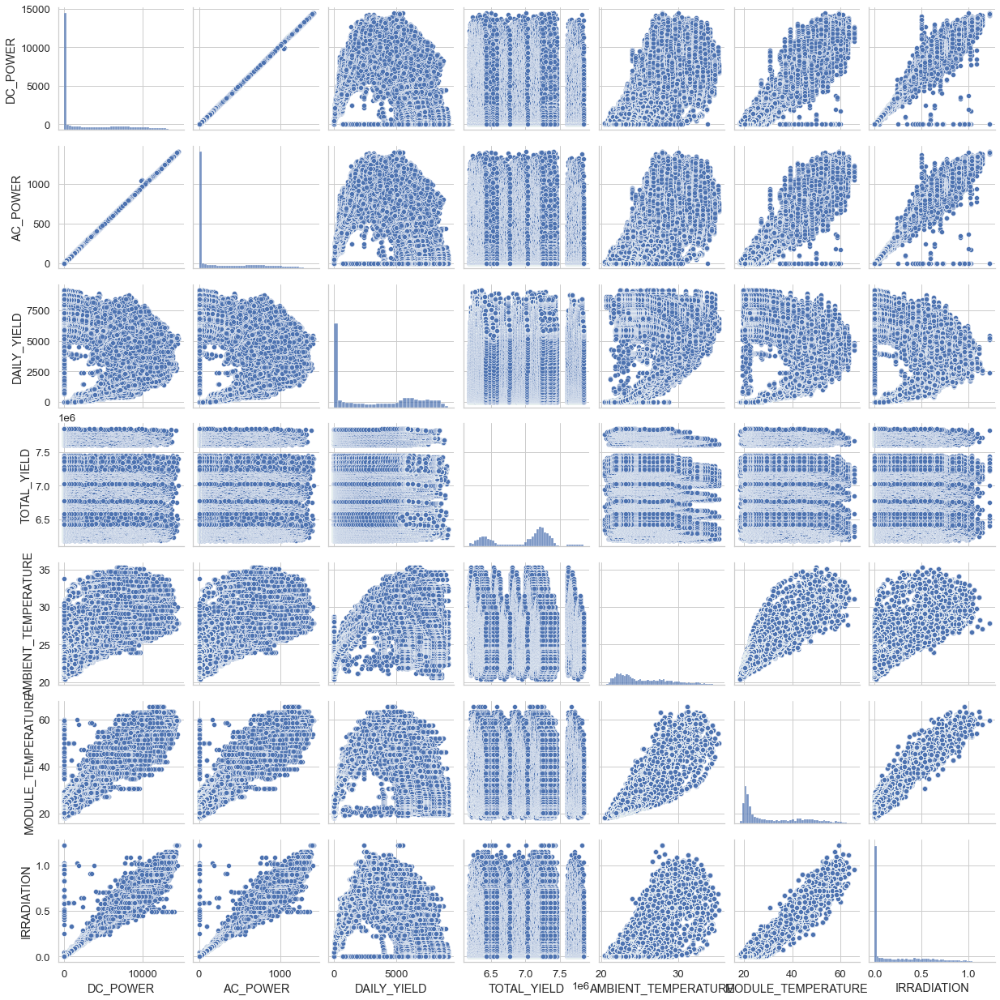

In [12]:
sns.set(style='whitegrid', palette = "deep", font_scale = 1.2, rc = {"figure.figsize": [15,5]})
fig_pair = sns.pairplot(df_plant1)
plt.show()

From a general perspective, we expect daily yield to be a function of irradiation. There may be a parabolic correlation, and we can use our existing correlations to end up with similar solution. 

From the second graph, we can determine:
- Very few outliers in DC_POWER // AC_POWER
    - These are likely failures associated with the inverter; DC but little AC = malfunction/fault
    irradiation vs. no power to indicate a fault. 
- Many outlier in AC_POWER and DC_POWER // IRRADIATION 
    - These are likely failures associated with the panel lines; irradiation but no power = faultyPV. 

## Total Daily Yield & AC/DC Power 

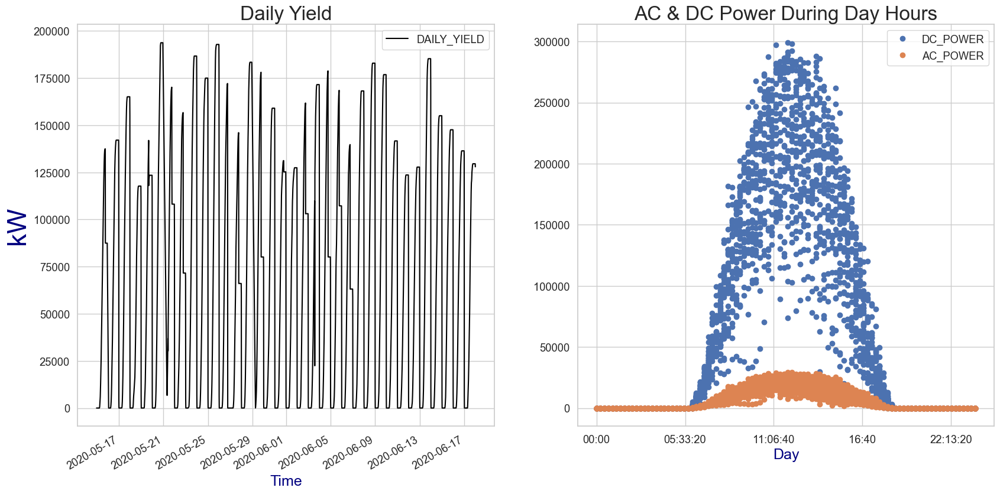

In [13]:
df_gen1 = gen_1.groupby(['DATE_TIME']).sum().reset_index()
df_gen1['Time'] = df_gen1['DATE_TIME'].dt.time

fig, ax = plt.subplots(ncols=2, nrows=1, dpi=100, figsize=(20,10))

# Daily Yield

df_gen1.plot(x='DATE_TIME', y='DAILY_YIELD', color = 'black', ax = ax[0])
ax[0].set_title('Daily Yield', fontsize = 24)
ax[0].set_xlabel('Time', color='navy', fontsize = 18)
ax[0].set_ylabel('kW',color='navy', fontsize = 32)

# AC & DC

df_gen1.plot(x='Time', y = ['DC_POWER', 'AC_POWER'], style='o',ax=ax[1])
ax[1].set_title('AC & DC Power During Day Hours', fontsize=24)
ax[1].set_xlabel('Day', color='navy', fontsize = 18)


plt.show()


In [14]:
# df_daily = gen_1.copy()
# df_daily['Date'] = df_daily['DATE_TIME'].dt.date

# df_daily = df_daily.groupby('Date').sum().reset_index()

# fig, ax = plt.subplots(ncols=2, nrows=1, dpi=100, figsize=(20,10))

# # Per Day Yield
# df_daily.plot(x='Date', y='DAILY_YIELD', color = 'black', ax = ax[0])
# ax[0].set_title('Daily Yield', fontsize = 24)
# ax[0].set_xlabel('Time', color='navy', fontsize = 18)
# ax[0].set_ylabel('kW',color='navy', fontsize = 32)

# # Total Yield
# df_daily.plot(x='Date', y = 'TOTAL_YIELD', kind = 'bar', color = 'navy' , ax=ax[1])
# ax[1].set_title('Total Yield per Day', fontsize=24)
# ax[1].set_xlabel('Day', color='navy', fontsize = 18)

# # Graphs are a bit messed up 
# fig.autofmt_xdate(rotation=45)
# plt.show()

## Sensor Data

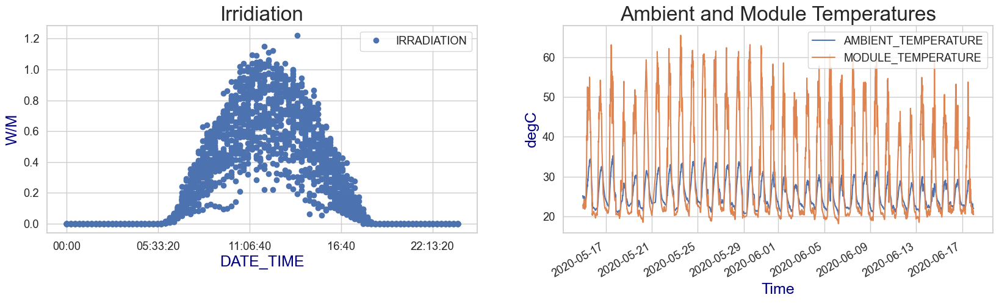

In [15]:
df_sen1 = sen_1.groupby('DATE_TIME').sum().reset_index()
df_sen1['Time'] = df_sen1['DATE_TIME'].dt.time

fig, ax = plt.subplots(nrows=1, ncols=2, dpi=100, figsize = (20,5))

# Irridiation
df_sen1.plot(x='Time', y='IRRADIATION', ax = ax[0], style = 'o')
ax[0].set_title('Irridiation', fontsize = 24)
ax[0].set_xlabel('DATE_TIME', color='navy', fontsize = 18)
ax[0].set_ylabel('W/M',color='navy', fontsize = 18)
# Temperatures 
df_sen1.plot(x='DATE_TIME', y=['AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE'], ax=ax[1])
ax[1].set_title('Ambient and Module Temperatures', fontsize = 24)
ax[1].set_xlabel('Time', color='navy', fontsize = 18)
ax[1].set_ylabel('degC',color='navy', fontsize = 18)
plt.show()


## Power Conversion
The Inverter will take the DC current and convert it to AC, which is usable energy for domestic use.

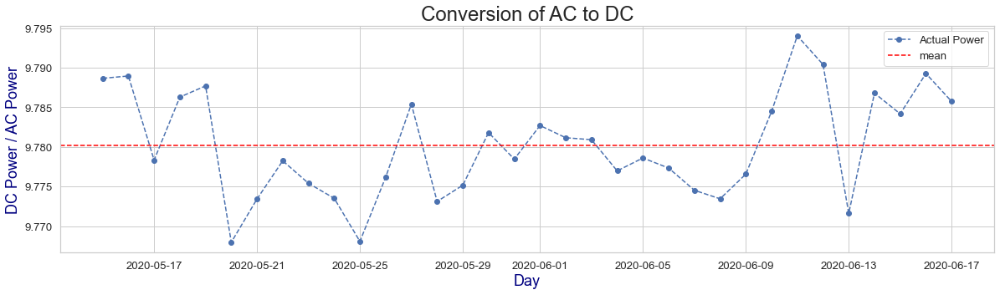

In [16]:
# Need AC/DC 
conv = gen_1.copy()
conv['Date'] = conv['DATE_TIME'].dt.date
conv = conv.groupby('Date').sum().reset_index()
conv['Conversion'] = conv['AC_POWER'] / conv['DC_POWER'] * 100

# Conversion Plot
conv.plot(x='Date', y = 'Conversion', style='o--', figsize=(20,5), label='Actual Power')
plt.title('Conversion of AC to DC', fontsize=24)
plt.xlabel('Day', color='navy', fontsize = 18)
plt.ylabel('DC Power / AC Power', fontsize = 18, color = 'navy')
plt.axhline(conv['Conversion'].mean(), linestyle='--', color = 'red', label='mean')
plt.legend()
plt.show()

## Which inverter is not working?
The previous data didn't tell us much because the conversion is within 0.02%. We have to find out which one is failing on us based on the inverter tags.

In [17]:
# Function to check if time is during daytime operation
def time_in_range(start, end, x):
    """Return true if x is in the range [start, end]"""
    if start <= end:
        return start <= x <= end
    else:
        return start <= x or x <= end
    
# set normal daytime operation range
start=dt.time(6,30,0) # sunrise
end=dt.time(17,30,0) # sunset

# Return "Normal" if operation is normal and "Fault" if operation is faulty
df_plant1["STATUS"] = 0
for index in df_plant1.index:
    if  time_in_range(start, end, df_plant1["Time"][index]) and df_plant1["DC_POWER"][index] == 0:
        df_plant1["STATUS"][index] = "Fault"
    else:
        df_plant1["STATUS"][index] = "Normal"
        
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig1 = px.scatter(df_plant1, x="IRRADIATION", y="DC_POWER", title="Fault Identification", 
                 color="STATUS", labels={"DC_POWER":"DC Power [kW]", "IRRADIATION":"Irradiation"})
fig1.update_traces(marker=dict(size=3, opacity=0.7), selector=dict(mode='marker'))

fig2 = px.bar(df_plant1[df_plant1['STATUS'] =="Fault"]["Date"].value_counts(), title="Fault Events", 
             labels = {"value" : "Fault", "index":"Date","SENSOR_NAME":"Inverter"})
fig2.update(layout_showlegend=False)

#Date & Inverter Time series
fig3 = px.bar(df_plant1[df_plant1["STATUS"]=="Fault"]["SOURCE_KEY"].value_counts(),title="Fault Events", 
              labels = {"value" : "Fault", "index":"SOURCE_KEY","SENSOR_NAME":"Inverter"})
fig3.update(layout_showlegend=False)
fig1.show()
fig2.show()
fig3.show()



In [18]:
df_plant1.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,Date,Time,STATUS
0,2020-05-15,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,25.184316,22.857507,0.0,2020-05-15,00:00:00,Normal
1,2020-05-15,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,25.184316,22.857507,0.0,2020-05-15,00:00:00,Normal
2,2020-05-15,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,25.184316,22.857507,0.0,2020-05-15,00:00:00,Normal
3,2020-05-15,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,25.184316,22.857507,0.0,2020-05-15,00:00:00,Normal
4,2020-05-15,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,25.184316,22.857507,0.0,2020-05-15,00:00:00,Normal


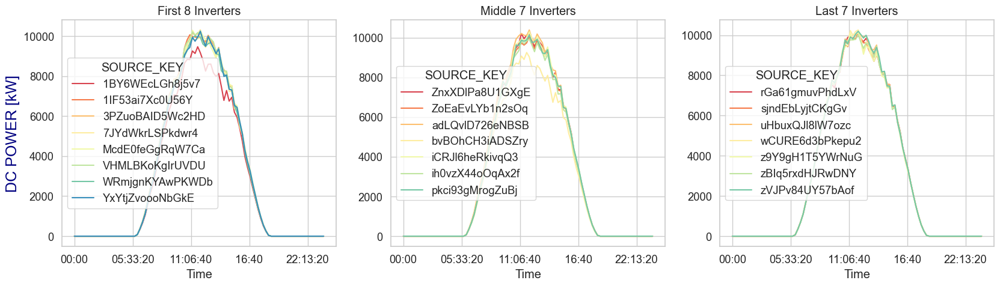

In [19]:
df_inv = gen_1.copy()
df_inv['Time'] = df_inv['DATE_TIME'].dt.time

df_inv = df_inv.groupby(['Time','SOURCE_KEY'])['DC_POWER'].mean().unstack()
#with pd.option_context('display.max_rows',None,'display.max_columns',None):
#    print(df_inv)

# There's 22 inverters so lets do 8/7/7 split
# 
cmap = sns.color_palette("Spectral", n_colors=8)
fig, ax = plt.subplots(nrows=1, ncols=3, dpi=100, figsize = (20,5))

df_inv.iloc[:,0:8].plot(ax=ax[0], color = cmap)
ax[0].set_title("First 8 Inverters")
df_inv.iloc[:,8:15].plot(ax=ax[1], color = cmap)
ax[1].set_title("Middle 7 Inverters")
df_inv.iloc[:,15:22].plot(ax=ax[2], color = cmap)
ax[2].set_title("Last 7 Inverters")

ax[0].set_ylabel("DC POWER [kW]", fontsize = 18, color = 'navy')
plt.show()



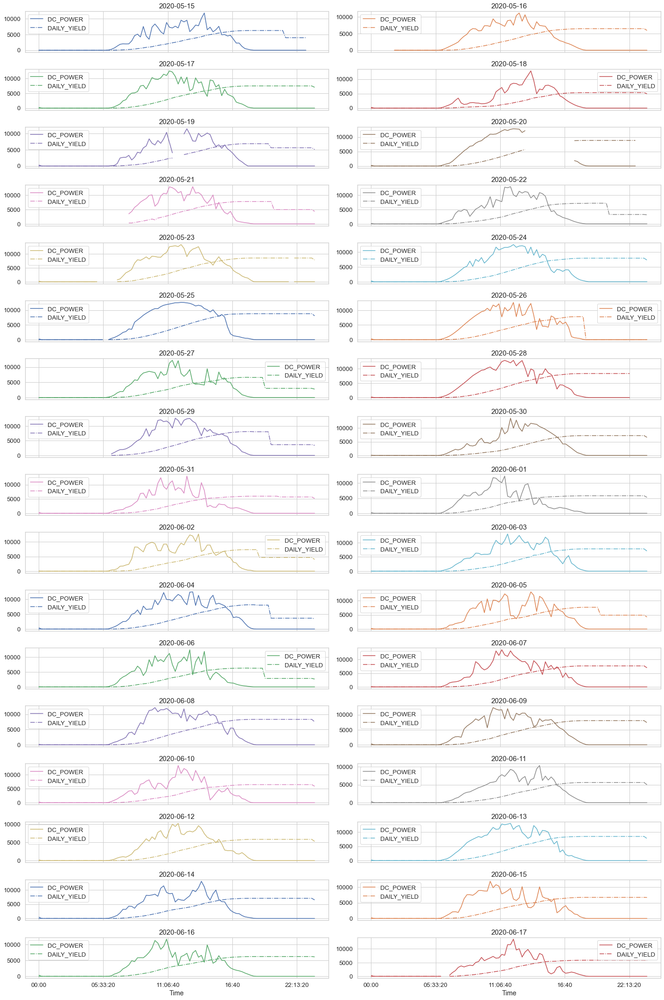

In [20]:
df_dailyg = gen_1.copy()
df_dailyg['Time'] = df_dailyg['DATE_TIME'].dt.time
df_dailyg['Date'] = df_dailyg['DATE_TIME'].dt.date

df_dailys = sen_1.copy()
df_dailys['Time'] = df_dailys['DATE_TIME'].dt.time
df_dailys['Date'] = df_dailys['DATE_TIME'].dt.date

cols = df_dailyg.groupby(['Time','Date'])['DC_POWER'].mean().unstack()
dcp = df_dailyg.groupby(['Time','Date'])['DC_POWER'].mean().unstack().plot(sharex=True, subplots=True, layout=(17,2),figsize=(20,30))
dym = df_dailyg.groupby(['Time','Date'])['DAILY_YIELD'].mean().unstack().plot(sharex=True, subplots=True, layout=(17,2),figsize=(20,30), style='-.', ax=dcp)

i = 0
for a in range(len(dcp)):
    for b in range(len(dcp[a])):
        dcp[a,b].set_title(cols.columns[i], size=15)
        dcp[a,b].legend(['DC_POWER','DAILY_YIELD'])
        i=i+1
        
plt.tight_layout()
plt.show()

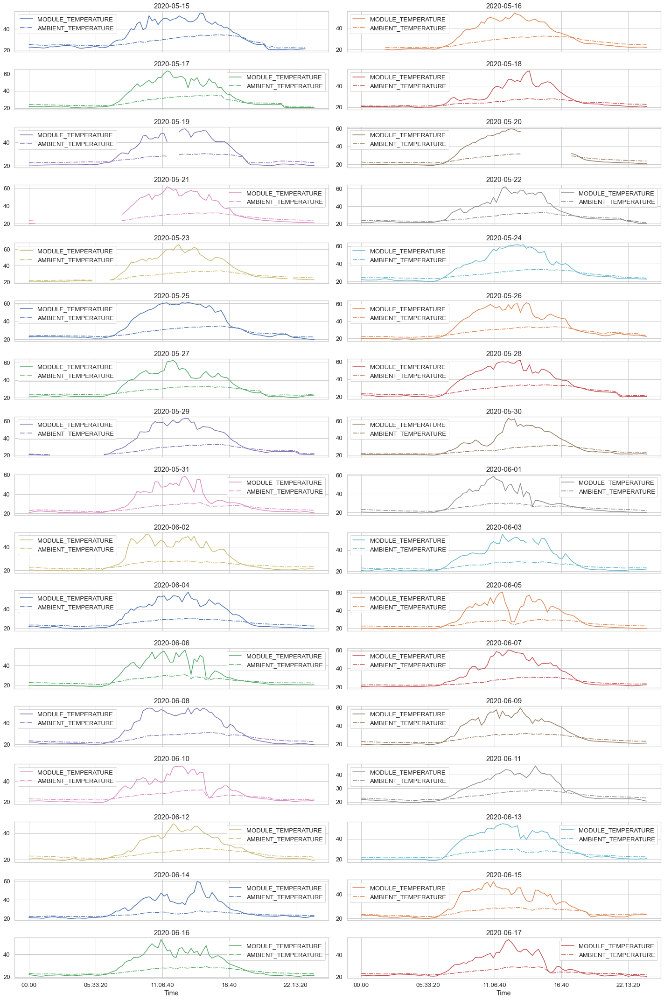

In [21]:

dmt = df_dailys.groupby(['Time','Date'])['MODULE_TEMPERATURE'].mean().unstack().plot(sharex=True, subplots=True, layout=(17,2),figsize=(20,30))
dat = df_dailys.groupby(['Time','Date'])['AMBIENT_TEMPERATURE'].mean().unstack().plot(sharex=True, subplots=True, layout=(17,2),figsize=(20,30), style='-.', ax=dmt)

i = 0
for a in range(len(dmt)):
    for b in range(len(dmt[a])):
        dmt[a,b].set_title(cols.columns[i], size=15)
        dmt[a,b].legend(['MODULE_TEMPERATURE','AMBIENT_TEMPERATURE'])
        i=i+1
        

plt.tight_layout()
plt.show()

In [22]:
# df_faultg = gen_1.copy()

# #1BY6WEcLGh8j5v7
# #bvBOhCH3iADSZry
# df_faultg = df_faultg[df_faultg['SOURCE_KEY']=='bvBOhCH3iADSZry']
# df_faultg['Time'] = df_faultg['DATE_TIME'].dt.time
# df_faultg['Date'] = df_faultg['DATE_TIME'].dt.date

# df_faults = sen_1.copy()
# df_faults = df_faults[df_faults['SOURCE_KEY']=='bvBOhCH3iADSZry']
# df_faults['Time'] = df_faults['DATE_TIME'].dt.time
# df_faults['Date'] = df_faults['DATE_TIME'].dt.date

# cols = df_faultg.groupby(['Time','Date'])['DC_POWER'].mean().unstack()
# dcf = df_faultg.groupby(['Time','Date'])['DC_POWER'].mean().unstack().plot(sharex=True, subplots=True, layout=(17,2),figsize=(20,30))
# dyf = df_faultg.groupby(['Time','Date'])['DAILY_YIELD'].mean().unstack().plot(sharex=True, subplots=True, layout=(17,2),figsize=(20,30), style='-.', ax=dcf)

# i = 0
# for a in range(len(dcf)):
#     for b in range(len(dcf[a])):
#         dcf[a,b].set_title(cols.columns[i], size=15)
#         dcf[a,b].legend(['DC_POWER','DAILY_YIELD'])
#         i=i+1
        

# plt.tight_layout()
# plt.show()

From the graphs above, we can determine that a majority of faults occured on June 7th and June 14th, with inverters 1BY6WEcLGh8j5v7 and bvBOhCH3iADSZry.

# Challenge 1: Prediction / Forecasting Failure
DC Power generated? -> I don't think I care much about the daily yield, if DC power gets wonky, then this is an indication of failure. Long term reliability would be nice for daily yield. 


## SEASONAL ARIMA(p,d,q) + (P,D,Q,m) model 

In [23]:
from pandas.tseries.offsets import DateOffset
! pip install pmdarima
from pmdarima.arima import auto_arima
from statsmodels.tsa.stattools import adfuller

In [24]:
pred_gen = gen_1.copy()
pred_gen = pred_gen.groupby('DATE_TIME').sum()
pred_gen = pred_gen['DAILY_YIELD'][-288:].reset_index()
pred_gen.set_index('DATE_TIME', inplace = True)


## Part 1. Augmented Dickey-Fuller Test :

This is a unit root test to see if a time series variable is non-stationary and possess a unit root. 
Null hypothesis = presence of unit root (non-stationary)
alt hypothesis = stationary or trend-stationarity 

The larger the negative value, the stronger the rejection that a unit root is present at some confidence level.

IF small p-value (<= 0.05) = strong evidence AGAINST NULL, reject the null

IF large p-value (> 0.05) = weak evidence AGAINST NULL, so can't reject null. 

Note that it doesn't mean you accept the null hypothesis. 

In [25]:
adf = adfuller(pred_gen['DAILY_YIELD'])
labels = ['ADF Test Stat','P-Value','# Lags Used', '# of Observations Used']
zipped = zip(adf,labels)
print('#### ADF Results ####')
for value, label in zipped:
    print(label + " : " + str(value))

if adf[1] <= 0.05:
    print("Reject Null. Data has no unit root and is stationary")
else:
    print("Cannot reject null. Data has unit root, indicating non-stationary")

#### ADF Results ####
ADF Test Stat : -2.28993764747936
P-Value : 0.175233820749297
# Lags Used : 1
# of Observations Used : 286
Cannot reject null. Data has unit root, indicating non-stationary


## Part 2. Train & Test Model

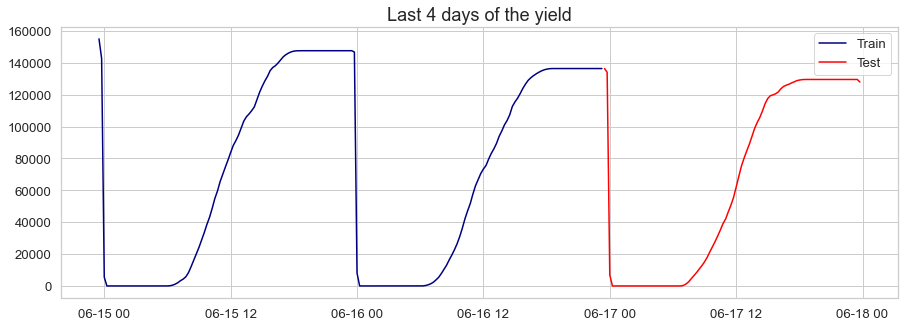

In [26]:
train = pred_gen[:192]
test = pred_gen[-96:]
plt.figure(figsize=(15,5))
plt.plot(train, label='Train', color='navy')
plt.plot(test, label='Test', color='red')
plt.title('Last 4 days of the yield', fontsize = 18)
plt.legend()
plt.show()

In [27]:
# An explanation of the Auto_Arima Function 
# order(AR,I,MA) -> auto regressive, integral, and moving average 
# Y = (Auto-Reg Parameters) + (MA Parameters)
# The I = if non-zero, it signifies a non-stationary data 
# best ARIMA to univariate time series, minimizes the given metric
# P = order of seasonal component for auto-regressive model
# D = integration order 
# Q = order of the MA model 

# Note that pdq = non-seasonal components, and PDQ = seasonal components

# There are 96 samples in one day, so it should look at a days worth of data, m = 96

arima_model = auto_arima(train, start_p=0, d=1, start_q=0,
                        max_p=4, max_d=4, max_q=4,
                        start_P=0, D=1, start_Q=0,
                         max_P=1, max_D=1, max_Q=1, m=96, 
                         seasonal = True,
                         error_action='warn', trace=True,
                         supress_warning=True, stepwise=True,
                         random_state=20, n_fits=1)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[96]             : AIC=1645.555, Time=0.84 sec
 ARIMA(1,1,0)(1,1,0)[96]             : AIC=1539.889, Time=16.27 sec
 ARIMA(0,1,1)(0,1,1)[96]             : AIC=1541.502, Time=22.49 sec
 ARIMA(1,1,0)(0,1,0)[96]             : AIC=1539.528, Time=2.94 sec
 ARIMA(1,1,0)(0,1,1)[96]             : AIC=1539.889, Time=14.31 sec
 ARIMA(1,1,0)(1,1,1)[96]             : AIC=inf, Time=31.10 sec
 ARIMA(2,1,0)(0,1,0)[96]             : AIC=1538.237, Time=4.89 sec
 ARIMA(2,1,0)(1,1,0)[96]             : AIC=1539.552, Time=25.22 sec
 ARIMA(2,1,0)(0,1,1)[96]             : AIC=1539.555, Time=20.43 sec
 ARIMA(2,1,0)(1,1,1)[96]             : AIC=inf, Time=34.88 sec
 ARIMA(3,1,0)(0,1,0)[96]             : AIC=1530.967, Time=6.36 sec
 ARIMA(3,1,0)(1,1,0)[96]             : AIC=1528.008, Time=32.93 sec
 ARIMA(3,1,0)(1,1,1)[96]             : AIC=inf, Time=55.99 sec
 ARIMA(3,1,0)(0,1,1)[96]             : AIC=1527.753, Time=27.31 sec
 ARIMA(4,1,0)(0,1,1)[96]

In [28]:
arima_model.summary()
# SARIMAX(4,1,0)x(0,1,1,96) was the best option

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  192
Model:             SARIMAX(4, 1, 0)x(0, 1, [1], 96)   Log Likelihood                -757.647
Date:                              Mon, 02 Aug 2021   AIC                           1527.294
Time:                                      21:47:26   BIC                           1542.617
Sample:                                           0   HQIC                          1533.486
                                              - 192                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2318      0.025     -9.315      0.000      -0.281      -0.183
ar.L2          0.0985      0.058      1.699      0.089      -0.015       0.212
ar.L3          0.0988      0.041      2.434      0.015       0.019       0.178
ar.L4          0.0265      0.068      0.389      0.697      -0.107       0.160
ma.S.L96      -0.1111      0.053     -2.100      0.036      -0.215      -0.007
sigma2      5.751e+05    6.5e+04      8.852      0.000    4.48e+05    7.02e+05
===================================================================================
Ljung-Box (L1) (Q):                  17.39   Jarque-Bera (JB):                27.18
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               5.49   Skew:                             0.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Part 3. Predict next 2 days

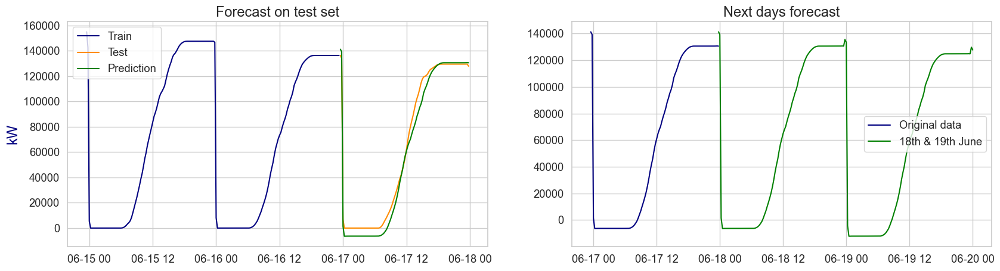

In [29]:
future = [test.index[-1]+ DateOffset(minutes=x) for x in range(0,2910,15)]
prediction = pd.DataFrame(arima_model.predict(n_periods =96), index=test.index)
prediction.columns = ['Predicted']

fig, ax = plt.subplots(ncols=2, nrows=1, dpi=100, figsize=(20,5))
ax[0].plot(train,label='Train',color='navy')
ax[0].plot(test,label='Test',color='darkorange')
ax[0].plot(prediction,label='Prediction',color='green')
ax[0].legend()
ax[0].set_title('Forecast on test set',size=17)
ax[0].set_ylabel('kW',color='navy',fontsize=17)

f_pred=pd.DataFrame(arima_model.predict(n_periods=194),index=future)
f_pred.columns=['Predicted Yield']
ax[1].plot(prediction,label='Original data',color='navy')
ax[1].plot(f_pred,label='18th & 19th June',color='green')
ax[1].legend()
ax[1].set_title('Next days forecast',size=17)
plt.show()



# Challenge 2&3: Fault Detection

In [30]:
# drop unnecessary columns and merge both dataframes along DATE_TIME
df_plant1 = pd.merge(gen_1, sen_1.drop(columns = 'SOURCE_KEY'), on='DATE_TIME')
df_plant1["DATE"] = pd.to_datetime(df_plant1["DATE_TIME"]).dt.date # add new column with date
df_plant1["TIME"] = pd.to_datetime(df_plant1["DATE_TIME"]).dt.time 
df_plant1["DATE_STR"] = df_plant1["DATE"].astype(str)

In [31]:
def time_in_range(start, end, x):
    """Return true if x is in the range [start, end]"""
    if start <= end:
        return start <= x <= end
    else:
        return start <= x or x <= end
    
# set normal daytime operation range
start=datetime.time(6,0,0) # sunrise
end=datetime.time(18,0,0) # sunset

# Create new column to check proper operation
# Return "Normal" if operation is normal and "Fault" if operation is faulty
df_plant1["STATUS"] = 0
for index in df_plant1.index:
    if  time_in_range(start, end, df_plant1["TIME"][index]) and df_plant1["DC_POWER"][index] == 0:
        df_plant1["STATUS"][index] = "Fault"
    else:
        df_plant1["STATUS"][index] = "Normal"


NameError: name 'datetime' is not defined

## Linear Regression Model

In [ ]:
from sklearn.linear_model import LinearRegression

# Model
reg = LinearRegression()

# choose training data
df_train = df_plant1[:48000]

#train_dates = ["2020-05-16", "2020-05-17","2020-05-18" ,"2020-05-19", "2020-05-20", "2020-05-21"]
#df_train = df_plant1[df_plant1["DATE_STR"].isin(train_dates)]


#fit & predict
reg.fit(df_train[["IRRADIATION"]], df_train.DC_POWER)
prediction = reg.predict(df_plant1[["IRRADIATION"]])

# save prediction, residual, and absolute residual
df_train["Prediction"] = reg.predict(df_train[["IRRADIATION"]])
df_train["Residual"] = df_train["Prediction"] - df_train["DC_POWER"]
df_plant1["Prediction"] = reg.predict(df_plant1[["IRRADIATION"]])
df_plant1["Residual"] = df_plant1["Prediction"] - df_plant1["DC_POWER"]
df_plant1["Residual_abs"] = df_plant1["Residual"].abs()

# choose data
day = "2020-06-14"
inverter1 = "1IF53ai7Xc0U56Y"
inverter2 = "1BY6WEcLGh8j5v7"
df_pred = df_plant1[(df_plant1["DATE_STR"] == day)].copy()

fig, ax = plt.subplots(1, 2, dpi=100, figsize=(20,10))
mask1 = df_pred["SOURCE_KEY"] == inverter1
mask2 = df_pred["SOURCE_KEY"] == inverter2
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask1]['DC_POWER'], label="Measured DC", color="b", ax=ax[0])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask1]['Residual'], label="Residual", color="g", ax=ax[0])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask1]['Prediction'], label="Predicted DC", color="r", ax=ax[0])

sns.lineplot(df_pred['DATE_TIME'],df_pred[mask2]['DC_POWER'], label="Measured DC", color="b", ax=ax[1])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask2]['Residual'], label="Residual", color="g", ax=ax[1])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask2]['Prediction'], label="Predicted DC", color="r", ax=ax[1])

plt.gcf().axes[0].xaxis.set_major_formatter(xformatter) # set xaxis format to time only
plt.gcf().axes[1].xaxis.set_major_formatter(xformatter) # set xaxis format to time only
ax[0].set_xlabel("Time")
ax[1].set_xlabel("Time")
ax[0].set_ylabel("DC Power (kW)")
ax[1].set_ylabel("")
ax[1].set_ylim(-4000, 14000)
ax[0].set_title("Normal Operation")
ax[1].set_title("Fault Detected")
plt.show()

## Non-linear Model using Predictors

I will be using Hooda et al.'s non-linear model:
$$P(t) = aE(t) \biggl{(}1-b(T(t) + \frac{E(t)}{800}(c-20)-25)-dln(E(t)))\biggr{)}$$
where, E(t) = irradiance, T(t) = module tmperature, and a-d are the coefficients that will be calculated to predict the power output of the solar plant. 


In [ ]:

def func(X, a, b, c, d):
    '''Nonlinear function to predict DC power output from Irradiation and Temperature.'''
    #https://www.researchgate.net/publication/309399733_PV_Power_Predictors_for_Condition_Monitoring
    x,y = X
    x=x*1000
    y=y*1000
    return a*x*(1-b*(y+x/800*(c-20)-25)-d*np.log(x+1e-10))

p0 = [1.,0.,-1.e4,-1.e-1] # starting values
popt, pcov = curve_fit(func, (df_train.IRRADIATION, df_train.MODULE_TEMPERATURE), df_train.DC_POWER, p0, maxfev=5000)
# popt = array of optimal values for paratmers that minimzes sum of squares of residuals
# pcov = 2D arry which has estimated covariance of popt. The sqrt of the diag will give us the sigma

sig = np.sqrt(np.diagonal(pcov))

# predict & save
df_train["Prediction_NL"] = func((df_train['IRRADIATION'], df_train['MODULE_TEMPERATURE']), *popt)
df_train["Residual_NL"] = df_train["Prediction_NL"] - df_train["DC_POWER"]

df_plant1["Prediction_NL"] = func((df_plant1['IRRADIATION'], df_plant1['MODULE_TEMPERATURE']), *popt)
df_plant1["Residual_NL"] = df_plant1["Prediction_NL"] - df_plant1["DC_POWER"]

plt.scatter(df_plant1['IRRADIATION'], df_plant1['DC_POWER'], label="Actual")
plt.scatter(df_plant1['IRRADIATION'], df_plant1['Prediction_NL'], color="r", label="NL Prediction")
plt.legend()
plt.xlabel("Irradiation (kW/m²)")
plt.ylabel("DC Power (kW)")
plt.title("Nonlinear Model Prediction")
plt.show()

We note that the data does have quite a residual, the NL model can help determine the expected by using an envelope to encompass variation in the solar train.

In [ ]:
# choose data
day = "2020-06-14"
inverter1 = "1IF53ai7Xc0U56Y"
inverter2 = "1BY6WEcLGh8j5v7"
df_pred = df_plant1[(df_plant1["DATE_STR"] == day)].copy()

fig, ax = plt.subplots(1, 2, dpi=100, figsize=(20,10))
mask1 = df_pred["SOURCE_KEY"] == inverter1
mask2 = df_pred["SOURCE_KEY"] == inverter2
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask1]['DC_POWER'], label="Measured DC", color="b", ax=ax[0])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask1]['Residual_NL'], label="NL Residual", color="g", ax=ax[0])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask1]['Prediction_NL'], label="NL Predicted DC", color="r", ax=ax[0])

sns.lineplot(df_pred['DATE_TIME'],df_pred[mask2]['DC_POWER'], label="Measured DC", color="b", ax=ax[1])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask2]['Residual_NL'], label="NL Residual", color="g", ax=ax[1])
sns.lineplot(df_pred['DATE_TIME'],df_pred[mask2]['Prediction_NL'], label="NL Predicted DC", color="r", ax=ax[1])

plt.gcf().axes[0].xaxis.set_major_formatter(xformatter) # set xaxis format
plt.gcf().axes[1].xaxis.set_major_formatter(xformatter) # set xaxis format
ax[0].set_xlabel("Time")
ax[1].set_xlabel("Time")
ax[0].set_ylabel("DC Power (kW)")
ax[1].set_ylabel("")
ax[0].set_ylim(-2500, 14000)
ax[1].set_ylim(-2500, 14000)
ax[0].set_title("Normal Operation")
ax[1].set_title("Fault Detected")

plt.show()

## Model Comparison

There are multiple ways to determine which model is better. For simplicity, we will compare the RMSE to determine the better fit. Note that the LR seems to over-predict over the 14,000 mark. It is possible that it is more accurate in the 8,000 - 14,000 kW range. In this case, we can use a piece-wise model to reduce the RMSE for the overall analysis. 

In [ ]:
# https://plotly.com/python/line-and-scatter/
# Too much data that it lags - not including this. 
# fig = go.Figure()
# # Add Traces
# fig.add_trace(go.Scatter(x= df_train["Prediction"], y=df_train["Residual"], 
#                          mode = 'markers', name = 'Residual_LR'
#                         label = {"Prediction":"Predicted DW Power [kW]", "Residual":"Residual"}))
# fig.add_trace(go.Scatter(x= df_train["Prediction_NL"], y=df_train["Residual_NL"], 
#                          mode = 'markers', name = 'Residual_NL'))

# fig.show()


In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(df_train['Prediction'], df_train['Residual'], color="b", label="LR Residual")
sns.scatterplot(df_train['Prediction_NL'], df_train['Residual_NL'], color="r", label="NL Residual")
ax = plt.gca()
plt.ylabel("Residual")
plt.xlabel("Predicted DC Power")
plt.title("Model Comparison")
plt.show()

In [ ]:
mse_LR = mean_squared_error(df_pred[mask1]['DC_POWER'],df_pred[mask1]['Prediction'], squared=False) 
mse_NL = mean_squared_error(df_pred[mask1]['DC_POWER'],df_pred[mask1]['Prediction_NL'], squared=False)

print(mse_LR)
print(mse_NL)

In [ ]:
# Fault Detection using NL Model

In [ ]:
# set confidence range for residual for fault
limit_fault=3000

# Create new column to check proper operation
# Return "Normal" if operation is normal and "Fault" if operation is faulty
df_plant1["STATUS_NL"] = 0
for index in df_plant1.index:
    if  df_plant1["Residual_NL"][index] > limit_fault:
        df_plant1["STATUS_NL"][index] = "Fault"  
    else:
        df_plant1["STATUS_NL"][index] = "Normal"

In [ ]:
fig=px.bar(df_plant1[df_plant1["STATUS_NL"]== "Fault"]["DATE"].value_counts(), title="Faults: Nonlinear Model", labels={"value":"Faults", "index":"Date", "SENSOR_NAME":"Inverter"}, )
fig.update(layout_showlegend=False)
fig.show()

fig=px.bar(df_plant1[df_plant1["STATUS_NL"]== "Fault"]["SOURCE_KEY"].value_counts(), title="Underperformance & Faults: Nonlinear Model", labels={"value":"Faults", "index":"Inverter", "SENSOR_NAME":"Inverter"})
fig.update(layout_showlegend=False)
fig.show()

In [ ]:
fig = px.scatter(df_plant1, x="DATE_TIME", y="DC_POWER", title="Identifying Faults", color="STATUS_NL", 
                 labels={"DC_POWER":"DC Power [kW]", "DATE_TIME":"Time", "STATUS_NL":"Status"},
                 range_x=[datetime.date(2020, 6, 6), datetime.date(2020, 6, 15)])
fig.update_traces(marker=dict(size=1, opacity=0.7), selector=dict(mode='marker'))
fig.show()

Let's talk the significance of the data above. In a seasonal data, it can be hard to distingusih faults due to the vast amount of data points. The anomalies can be lost and easily forgotten when DC_Power is greater than zero. This is lost dollars and opportunities that can be fixed through preventative maintenace. 

# Summary

## Can we predict the power generation for next couple of days?
We were able to create code to test the prediction for the following days 1-2 days to estimate the power usage. The next steps would be to use ambient temperature or weather station data estimate irradiation then predict DC_POWER. We can apply it real time to a process historian to help operators track generation.

##  Can we identify the need for panel cleaning or maintenance?
We were able to identify events of underperformance which includes equipment failures. We used linear regression and non-linear modeling to predict DC_Power using irradiance and module temperature. This can easily be used for an operator to clean or perform maintenace. Note that it does not specify the exact issue with the solar panel, but it can distinguish between inverter or solar panel. 

##  Can we identify faulty or suboptimally performing equipment?
Yes, we can! See note above


<b>Thank you for reading my notebook and please leave a review on how I can improve!